<a href="https://colab.research.google.com/github/yenngocduong/Object-Counting-Handwriting-Recognition-Anomaly-Detection-in-Acumen-Chip-Images/blob/main/counting_chips.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **IMPORT**

In [ ]:
import os
import re
import cv2
import numpy as np
from os.path import isfile, join
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
col_frames = os.listdir("/content/drive/MyDrive/D37/nus-sds-dsc2021/train_data/train_images")

FileNotFoundError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# sort file names
col_frames.sort(key=lambda f: int(re.sub('\D', '', f)))

In [ ]:
#create empty list:
col_images = []

for frame in col_frames:
  #read_frames
  temp_img = cv2.imread("/content/drive/MyDrive/D37/nus-sds-dsc2021/train_data/train_images/" + frame)
  #append the temp image into list
  col_images.append(temp_img)

col_images[0].shape


## **TEST FROM HERE**

In [ ]:
i = 3
img = cv2.cvtColor(col_images[i], cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title("image: "+str(1001+i))
plt.show()

## **Remove background**

In [ ]:
rm_bg = img
 
rgb_planes = cv2.split(rm_bg)
 
result_planes = []
result_norm_planes = []
for plane in rgb_planes:
    dilated_img = cv2.dilate(plane, np.ones((30, 30), np.uint8))
    bg_img = cv2.medianBlur(dilated_img, 21)
    diff_img = 255 - cv2.absdiff(plane, bg_img)
    norm_img = cv2.normalize(diff_img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    result_planes.append(diff_img)
    result_norm_planes.append(norm_img)
 
result = cv2.merge(result_planes)
result_norm = cv2.merge(result_norm_planes)

cv2_imshow(result)


In [ ]:
#Change to HSV
hsv = cv2.cvtColor(result, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv, (12, 25, 25), (39, 255,255))
#mask = cv2.inRange(hsv, (90, 15, 100), (170, 100, 100))
## slice the green
imask = mask>0
green = np.zeros_like(hsv, np.uint8)
green[imask] = hsv[imask]
#cv2.imwrite("hsv.png", green)
cv2_imshow(green)

# ***Change to HSV***

In [ ]:
#Change to HSV
hsv = cv2.cvtColor(col_images[i], cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv, (0, 25, 25), (43, 50, 50))
#mask = cv2.inRange(hsv, (90, 15, 100), (170, 100, 100))
## slice the green
imask = mask>0
green = np.zeros_like(img, np.uint8)
green[imask] = hsv[imask]
#cv2.imwrite("hsv.png", green)
cv2_imshow(green)

In [ ]:
ret,thresh = cv2.threshold(green,50,255,cv2.THRESH_BINARY)

grays = cv2.cvtColor(thresh, cv2.COLOR_BGR2GRAY)

#grays = cv2.cvtColor(green, cv2.COLOR_BGR2GRAY)

#plt.imshow(grays)
#plt.show()
cv2_imshow(grays)

In [ ]:
#decrease resolution of the image by using image dilation
kernel = np.ones((1,1), 'int')
dilated = cv2.dilate(grays, kernel, iterations = 1)

#plot
cv2_imshow(dilated)

## **CONTOURS**

In [ ]:
#find contours

contours, hierachy = cv2.findContours(dilated.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)


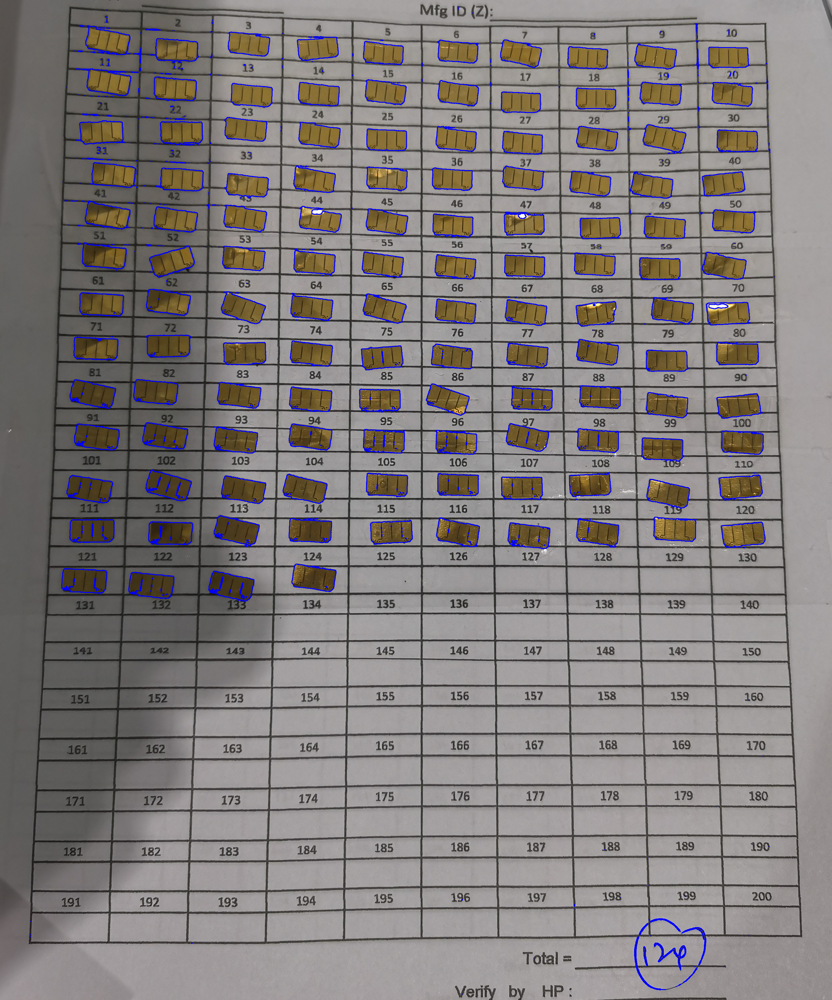

In [ ]:
temp_copy = col_images[i].copy()

cv2.drawContours(temp_copy, contours, -1, (255, 0, 0), 1)
cv2_imshow(temp_copy)

In [ ]:
len(contours)

In [ ]:
for i, cntr in enumerate(contours):
  print(cv2.contourArea(cntr))

In [ ]:
#valid contours

valid_contours = []

for i, cntr in enumerate(contours):
  if cv2.contourArea(cntr) >=800:
    valid_contours.append(cntr)

len(valid_contours)